### Methods defined in the notebook. See next section for example

In [1]:
import os

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from PIL import Image
import tensorflow as tf


In [2]:
def predict_image(image, model):
    category_to_label = {
        0: "Negative",
        1: "Primordial", 
        2: "Primary", 
        3: "Secondary", 
        4: "Tertiary", 
    }

    image = image.resize((224,224))
    image = np.array(image)
    image = tf.reshape(image, (1,224,224,3))
    pred = model.predict(image)
    predicted_category, proba = np.argmax(pred),  np.max(pred)
    predicted_label = category_to_label[predicted_category]
    return predicted_label, proba


In [3]:
def display_slice_and_predictions(coupe, predicted_locations):
    linewidth=3
    label_to_color = {
        "Negative": "grey", 
        "Primordial": "blue", 
        "Primary": "red", 
        "Secondary": "green", 
        "Teriary": "darkgreen"
    }
    
    plt.figure(figsize=(20, 20))
    plt.axis("off")
    plt.imshow(coupe)
    ax = plt.gca()
    for prediction in predicted_locations:
        box = prediction["bbox"]
        label = prediction["label"]
        proba = prediction["proba"]

        color = label_to_color[label]
        text = "{}: {:.2f}".format(label, proba)
        linestyle = "-" if proba == 1 else "--"

        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth, linestyle=linestyle
        )
        ax.add_patch(patch)

        ax.text(
            x1,
            y1,
            text,
            bbox={"facecolor": color, "alpha": 1},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()

In [4]:
def generate_grid_for_image(image, grid_widths=(800,)):
    """generator of square boxes that create a grid overlay for the given image"""
    for width in grid_widths:
        stride = width // 2

        x1 = 0
        y1 = 0
        while True:
            while True:
                bbox = (x1, y1, x1 + width, y1 + width)
                yield bbox

                x1 = x1 + stride
                if x1 + width > image.width:
                    break
            x1 = 0
            y1 += stride

            if y1 + width > image.height:
                break



In [10]:

def predict_locations_for_grid(coupe, grid, model):
    predicted_locations = []
    for box in grid:
        cropped_image = coupe.crop(box)
        label, proba = predict_image(cropped_image, model)
        if label != "Negative":
            predicted_locations.append({
                    "bbox": box,
                    "label": label,
                    "proba": proba
                })
    return predicted_locations


In [6]:
def load_true_locations(path, image_filename):
    """Return list of {bbox, label, proba}."""
    df = pd.read_csv(path)
    df = df.loc[df["filename"] == image_filename] 
    locations = []
    for _, row in df.iterrows():
        loc_dict = {
            "bbox": (row['xmin'], row['ymin'], row['xmax'], row['ymax']),
            "label": row["class"],
            "proba": 1
        }
        locations.append(loc_dict)
    return locations

# Actual Example: locating follicules in full ovary image


## Goal

We want to locate and classify follicles in ovary images.

## Method

- We devide the full image is a grid of smaller images
    - this is done twice with two scale factors: "vignettes" of size 1000px and 200px
    - the vignettes overlap when forming a grid
- A prediction is performed for each vignette
    - the image is rescaled to 124px to fit the required model input
    - model output is a list of probabilities [p1, p2, p3, p4, p5] corresponding to the five
      classes available during training: ["Negative", "Primordial", "Primary", "Secondary", "Tertiary"]
    - the top probability gives us the predicted class
- We filter predicted classes
    - we exclude the class "Negative" before displaying results
    - we exclude predictions with low probability (p < 0.6)
- We display the bounding boxes of the predicted vignettes
- No metric is implemented as of now to measure the performance of this approach


## Loading data

- source image as jpg
- pre-trained model.
    The model was trained on small images cropped from the full ovary images
- true location of follicles in image



In [7]:
this_folder = os.path.abspath("")
DATA_FOLDER = os.path.join(this_folder, "data")
MODELS_FOLDER = os.path.join(this_folder, "models")

IMAGE_TO_ANALYSE = 'D-1M01-3.jpg'
MODEL_NAME_FOR_PREDICTION = "classifier"


coupe = Image.open(os.path.join(DATA_FOLDER, "coupes_jpg", IMAGE_TO_ANALYSE))
model_loaded = tf.keras.models.load_model(os.path.join(MODELS_FOLDER, MODEL_NAME_FOR_PREDICTION))
true_locations = load_true_locations(os.path.join(DATA_FOLDER, "scenario1", 'labels.csv'), IMAGE_TO_ANALYSE)

2021-10-22 14:42:01.640366: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## True locations of follicles in image

True locations are displayed with a solid outline. Box color correspond to the true class of the follicle.

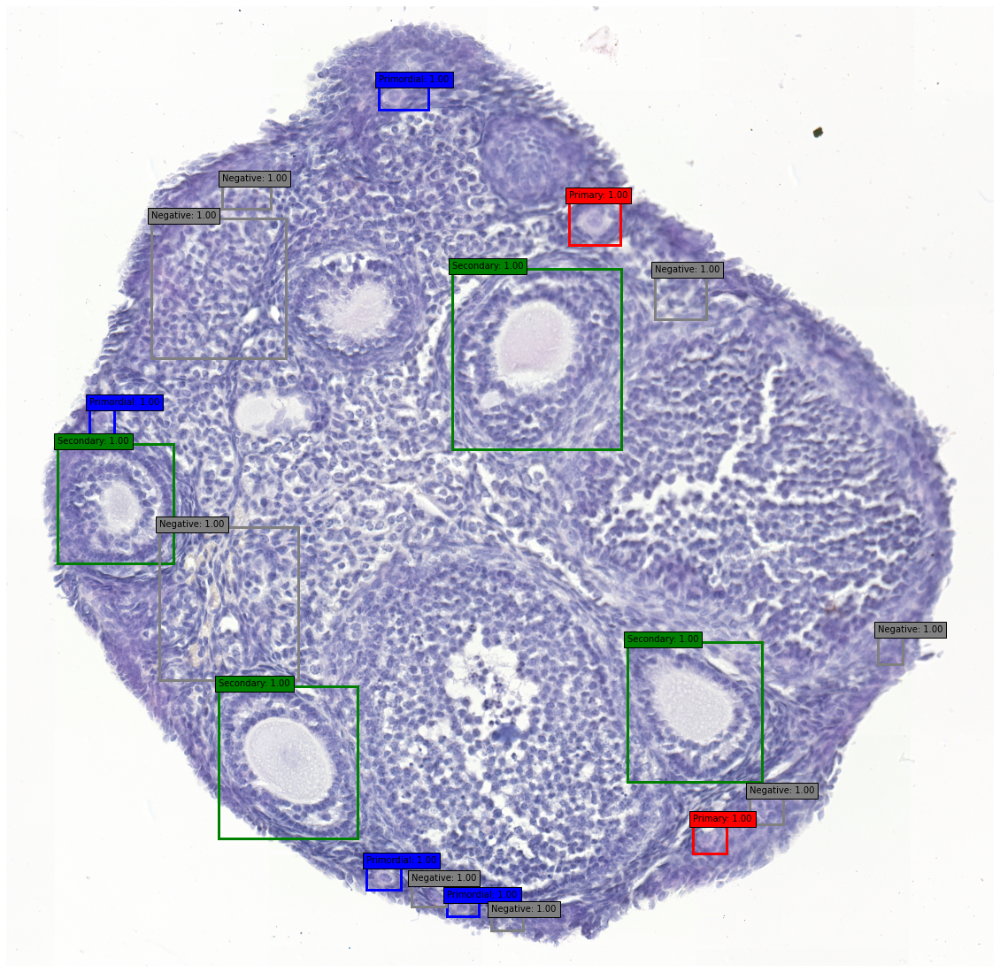

In [8]:
display_slice_and_predictions(coupe, true_locations)

## Predicting follicle locations on a large grid

We use a grid of 1000px. We observe that the model only predicts follicle of the category `"Secondary"` at this scale factor.

2021-10-22 14:43:37.826161: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


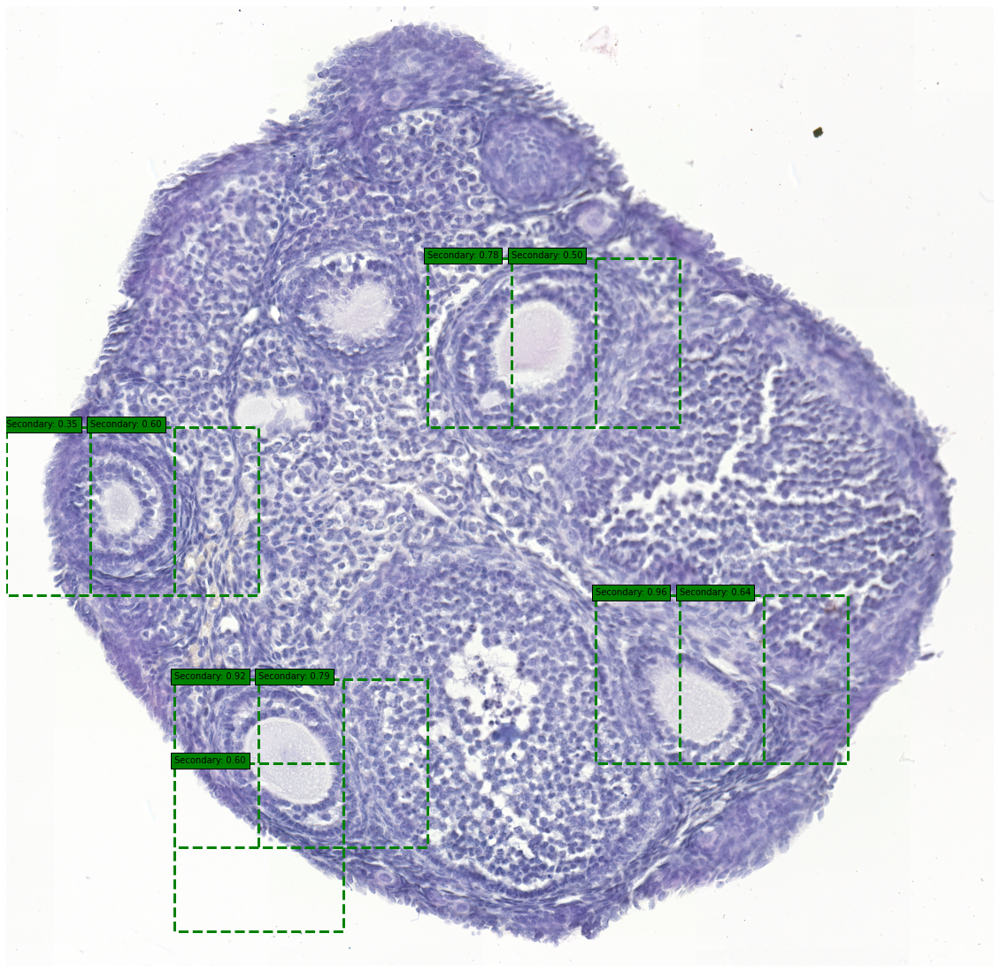

In [11]:
grid = generate_grid_for_image(coupe, grid_widths=[1000])
predicted_locations = predict_locations_for_grid(coupe, grid, model_loaded)
display_slice_and_predictions(coupe, predicted_locations)

## Predicting follicle locations on a composite grid

We use a grid of 200px. We observe that the model only predicts follicle of the categories `"Primary"` and `"Primordial"` at this scale factor.

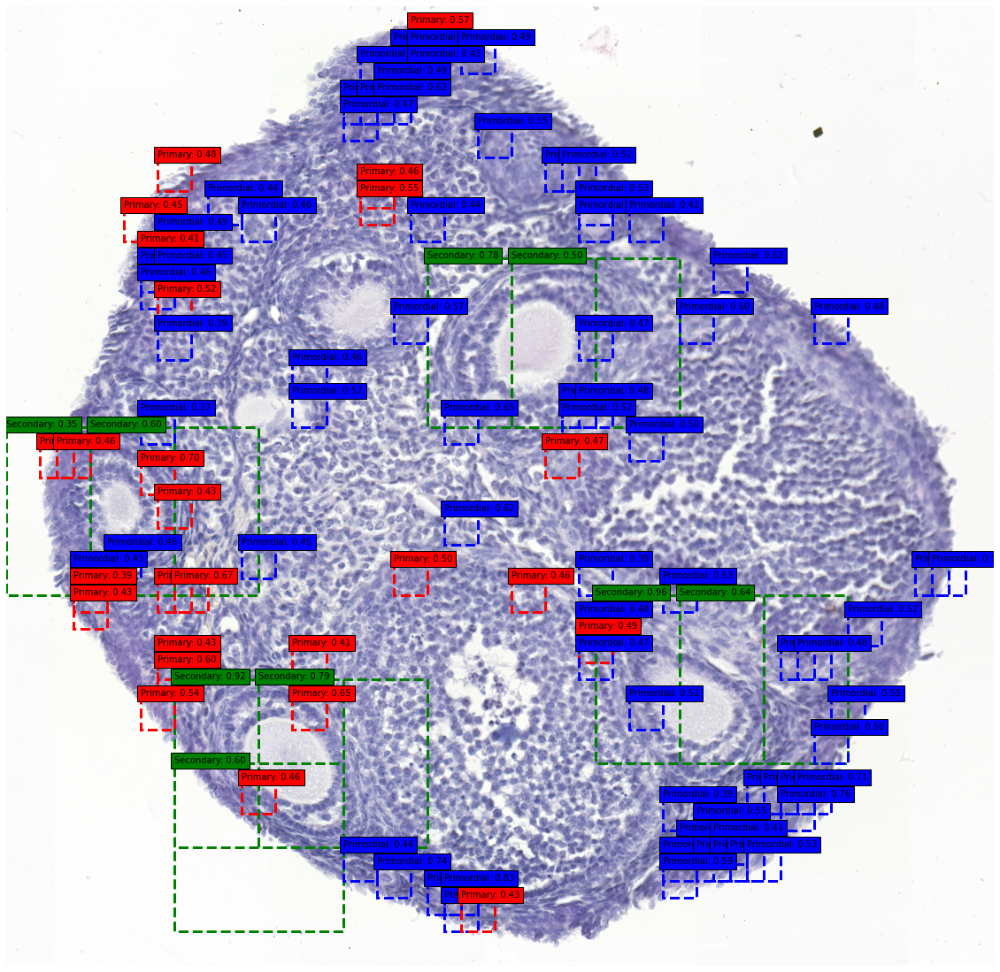

In [12]:
grid = generate_grid_for_image(coupe, grid_widths=[1000, 200])
predicted_locations = predict_locations_for_grid(coupe, grid, model_loaded)
display_slice_and_predictions(coupe, predicted_locations)

## Predictions + Ground Truth

- dashed = predictions
- solid = true locations

We observe:
- Secondary follicle are easy to locate
- the model is clueless for the other categories : Primary and Primordial

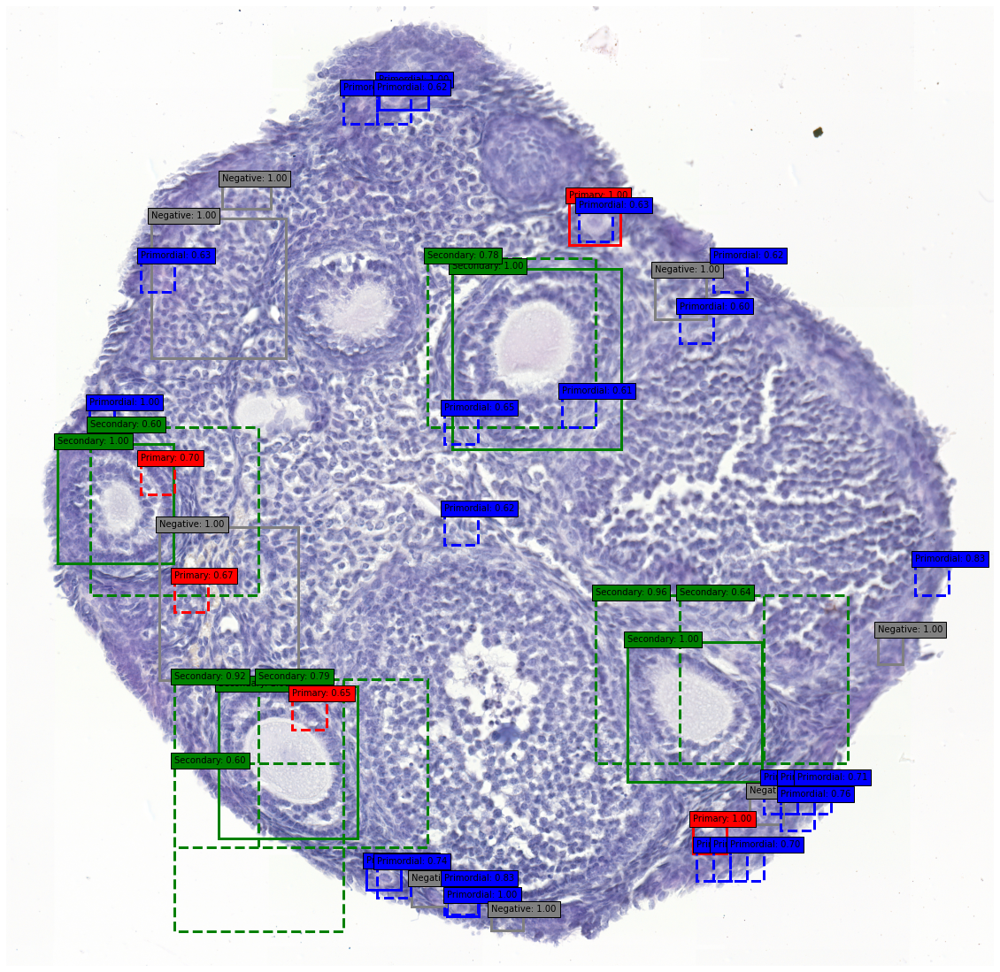

In [13]:
locations_to_display =  true_locations + [loc for loc in predicted_locations if loc["proba"] > 0.6]
display_slice_and_predictions(coupe, locations_to_display)

# Conclusions

At the moment, this simple approach seems to be viable only for large structures (Secondary follicles).

This method can be improved by:

#### better prediction methodology
- running predictions on more scale factors
- applying bounding-box overlap post-processing (IOU)
- using the size of the image as a feature

#### better training

At the moment the model is trained on images that differ a lot from the images used in predictions
- true bounding boxes are not square but are reshaped to square when provided to the model during training
- the class "Negative" is built from bouding boxes created by Rafael. During prediction many locations are
  seen by the model that are not in this "Negative" dataset.

  Furthermore the class imbalance is probably very different between training and prediction.

  A possible solution would be to generate a training dataset in the same way predictions are performed: create a grid
  of vignette and decide on a class for each of these vignettes. 

## Model evaluation

Although we have a robust evaluation methodology for the classification problem (see classification notebook), we did
not define a metric that could be used to evaluate the model on the Follicles Detection task.



# Model evaluation



In [22]:
def compute_iou(boxes1, boxes2):
    """Computes pairwise IOU matrix for given two sets of boxes

    Arguments:
      boxes1: A tensor with shape `(N, 4)` representing bounding boxes
        where each box is of the format `[x, y, x2, y2]`.
        boxes2: A tensor with shape `(M, 4)` representing bounding boxes
        where each box is of the format `[x, y, xmax, ymax]`.

    Returns:
      pairwise IOU matrix with shape `(N, M)`, where the value at ith row
        jth column holds the IOU between ith box and jth box from
        boxes1 and boxes2 respectively.
    """
    lu = np.maximum(boxes1[:, None, :2], boxes2[:, :2])
    rd = np.minimum(boxes1[:, None, 2:], boxes2[:, 2:])
    intersection = np.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = (boxes1[:,2] - boxes1[:, 0]) * (boxes1[:,3] - boxes1[:, 1])
    boxes2_area = (boxes2[:,2] - boxes2[:, 0]) * (boxes2[:,3] - boxes2[:, 1])
    union_area = np.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return np.clip(intersection_area / union_area, 0.0, 1.0)

def find_matching_bbox(bbox, list_of_bboxes, iou_threshold):
    """
    
    Return index, success
        index = index of bbox with highest iou
        success = if matching iou is greater than threshold
    """
    ious = compute_iou(np.array([bbox]), np.array(list_of_bboxes))[0, :]
    index, maximum = np.argmax(ious), np.max(ious)
    return index, maximum > iou_threshold



def compute_precision_recall(true_locations, predicted_locations, iou_threshold=0.3):
    classes = [
        "Primordial",
        "Primary",
        "Secondary",
        "Tertiary",
    ]
    precisions = {}
    recalls = {}
    thresholds = {}
    for predicted_class in classes:
        true_boxes = [
            location["bbox"]
            for location in true_locations
            if location["label"] == predicted_class
        ]
        if not true_boxes:
            continue

        pred_boxes = [
            (location["bbox"], location["proba"])
            for location in sorted(predicted_locations, key=lambda loc: loc["proba"], reverse=True)
            if location["label"] == predicted_class
        ]

        precision = []
        recall = []
        threshold = []
        n_positive_detections = 0
        n_true_detected = 0
        n_true_to_detect = len(true_boxes)
        for i, (pred_bbox, proba) in enumerate(pred_boxes):
            if len(true_boxes) > 0:
                index, success = find_matching_bbox(pred_bbox, true_boxes, iou_threshold)
                if success:
                    true_boxes.pop(index)
                    n_positive_detections += 1
                    n_true_detected += 1

            threshold.append(proba)
            precision.append(n_positive_detections / (i +1))
            recall.append(n_true_detected / n_true_to_detect)
            

        precisions[predicted_class] = precision
        recalls[predicted_class] = recall
        thresholds[predicted_class] = threshold

    return precisions, recalls, thresholds


from sklearn.metrics import PrecisionRecallDisplay

def display_metrics(precisions, recalls):
    classes = [
        "Primordial", 
        "Primary",
        "Secondary",
        "Tertiary",
    ]
    colors = ["navy", "turquoise", "darkorange", "cornflowerblue", "teal"]

    _, ax = plt.subplots(figsize=(7, 8))
    for class_to_predict, color in zip(classes, colors):
        try:
            precision = [1] + precisions[class_to_predict]
            recall = [0] + recalls[class_to_predict]
            average_precision = 0
            for i in range(1, len(precision)):
                average_precision += precision[i] * (recall[i] - recall[i-1])
            display = PrecisionRecallDisplay(
                recall=recall,
                precision=precision,
                average_precision=average_precision,
                # linestyle="--"
            )
            display.plot(ax=ax, name=f"Precision-recall for class {class_to_predict}", color=color, marker="o")
        except KeyError:
            pass
    plt.show(ax)



# Model evaluation

Each prediction is compared to the ground truth: bounding boxes of labelles follicles.

A prediction is considered correct if:
- same label as ground truth
- sufficient overlap of the predicted and true bounding boxes (iou > iou_threshold = 0.3)

Note that if several predictions overlap the same true bounding box only one will be considered as correct. The other
predictions will be considered as false positive.

We compute the precision-recall curve as well as the average precision.

For the given image we reach an average precision per class of:
- Secondary: 83%
- Primordial: 42%
- Primary: 0%
- Tertiary: no support in the image

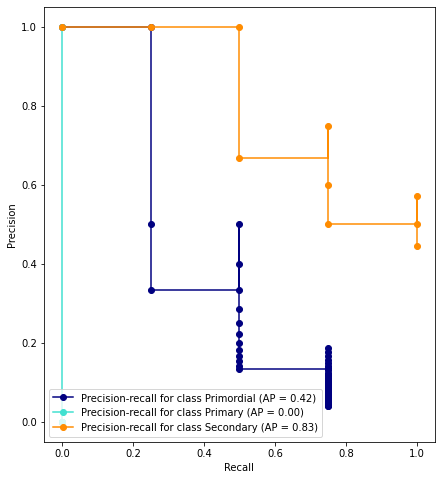

In [29]:

precisions, recalls, thresholds = compute_precision_recall(true_locations, predicted_locations, iou_threshold=0.3)
display_metrics(precisions, recalls)

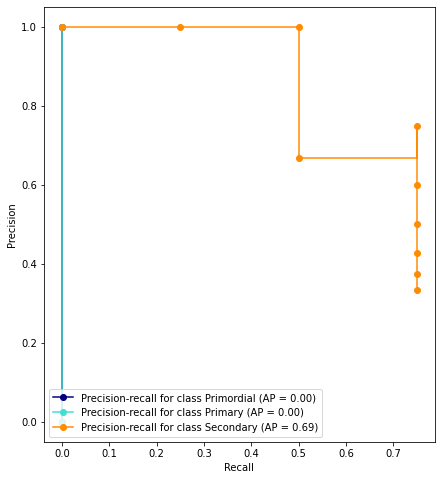

In [30]:

precisions, recalls, thresholds = compute_precision_recall(true_locations, predicted_locations, iou_threshold=0.5)
display_metrics(precisions, recalls)

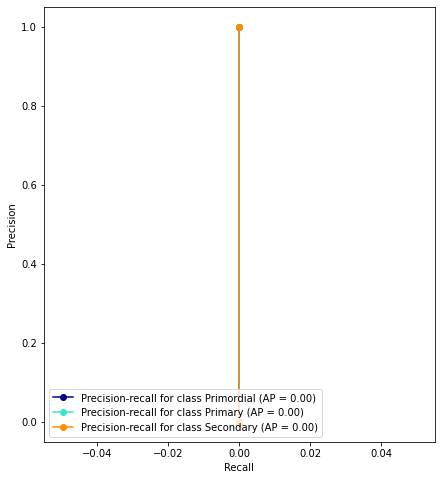

In [28]:
precisions, recalls, thresholds = compute_precision_recall(true_locations, predicted_locations, iou_threshold=0.75)
display_metrics(precisions, recalls)